# Task 1

---

## Web scraping and analysis

This Jupyter notebook includes some code to get you started with web scraping. We will use a package called `BeautifulSoup` to collect the data from the web. Once you've collected your data and saved it into a local `.csv` file you should start with your analysis.

### **Scraping data from Skytrax**

If you visit [https://www.airlinequality.com] you can see that there is a lot of data there. For this task, we are only interested in reviews related to British Airways and the Airline itself.

If you navigate to this link: [https://www.airlinequality.com/airline-reviews/british-airways] you will see this data. Now, we can use `Python` and `BeautifulSoup` to collect all the links to the reviews and then to collect the text data on each of the individual review links.

In [34]:
# Import Libraries
import requests
from bs4 import BeautifulSoup
import pandas as pd

In [35]:
import warnings
# Menonaktifkan semua peringatan
warnings.filterwarnings("ignore")

In [36]:
import requests
from bs4 import BeautifulSoup

base_url = "https://www.airlinequality.com/airline-reviews/british-airways"
pages = 39
page_size = 100

list_reviews = []
list_rating = []

# for i in range(1, pages + 1):
for i in range(1, pages + 1):

    print(f"Scraping page {i}")

    # Create URL to collect links from paginated data
    url = f"{base_url}/page/{i}/?sortby=post_date%3ADesc&pagesize={page_size}"

    # Collect HTML data from this page
    response = requests.get(url)

    # Parse content
    content = response.content
    parsed_content = BeautifulSoup(content, 'html.parser')

    for para in parsed_content.find_all("article", {"itemprop": "review"}):
        # Check if the review and rating exist before appending
        reviews = para.find("div", {"class": "tc_mobile"})
        rating = para.find("span", {"itemprop": "ratingValue"})

        # Append review text if found, otherwise append None
        if reviews:
            list_reviews.append(reviews.get_text().strip())
        else:
            list_reviews.append(None)

        # Append rating if found, otherwise append None
        if rating:
            list_rating.append(rating.get_text().strip())
        else:
            list_rating.append(None)
    
    print(f"   ---> {len(list_reviews)} total reviews so far")



Scraping page 1
   ---> 100 total reviews so far
Scraping page 2
   ---> 200 total reviews so far
Scraping page 3
   ---> 300 total reviews so far
Scraping page 4
   ---> 400 total reviews so far
Scraping page 5
   ---> 500 total reviews so far
Scraping page 6
   ---> 600 total reviews so far
Scraping page 7
   ---> 700 total reviews so far
Scraping page 8
   ---> 800 total reviews so far
Scraping page 9
   ---> 900 total reviews so far
Scraping page 10
   ---> 1000 total reviews so far
Scraping page 11
   ---> 1100 total reviews so far
Scraping page 12
   ---> 1200 total reviews so far
Scraping page 13
   ---> 1300 total reviews so far
Scraping page 14
   ---> 1400 total reviews so far
Scraping page 15
   ---> 1500 total reviews so far
Scraping page 16
   ---> 1600 total reviews so far
Scraping page 17
   ---> 1700 total reviews so far
Scraping page 18
   ---> 1800 total reviews so far
Scraping page 19
   ---> 1900 total reviews so far
Scraping page 20
   ---> 2000 total reviews so fa

In [37]:
# Check how many missing values after scraping data
missing_reviews = list_reviews.count(None)
missing_ratings = list_rating.count(None)

print(f"Total missing reviews: {missing_reviews}")
print(f"Total missing ratings: {missing_ratings}")


Total missing reviews: 0
Total missing ratings: 5


In [38]:
# Make dataframe
df = pd.DataFrame()
df["reviews"] = list_reviews
df["rating"] = list_rating
df.head()

,reviews,rating
0,✅ Trip Verified | On arriving at Mexico Airp...,1
1,✅ Trip Verified | I have flown British Airwa...,1
2,Not Verified | We bought tickets for a Geneva-...,1
3,✅ Trip Verified | Appalling service with fai...,1
4,✅ Trip Verified | British Airways charge you f...,6


### **Analysis Data**

In [39]:
# Summary data
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3877 entries, 0 to 3876
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   reviews  3877 non-null   object
 1   rating   3872 non-null   object
dtypes: object(2)
memory usage: 60.7+ KB


In [40]:
# Check Missing Values
df.isnull().sum()

reviews    0
rating     5
dtype: int64

In [41]:
# Show Missing Values
missing_rows = df[df.isnull().any(axis=1)]
missing_rows

,reviews,rating
3301,Cabin crew polite unfortunately BA ran out of ...,None
3431,Phoenix to London - outbound a wonderful and e...,None
3453,On past experience I chose BA for our long hau...,None
3682,LHR-CPH-LHR Business Class. This is a joke. Sc...,None
3718,I flew with British Airways with my mother fro...,None


In [42]:
# Drop Missing Values
df_cleaned = df.dropna()
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3872 entries, 0 to 3876
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   reviews  3872 non-null   object
 1   rating   3872 non-null   object
dtypes: object(2)
memory usage: 90.8+ KB


In [43]:
df_cleaned['rating'].value_counts()

rating
1     934
2     444
3     426
8     388
10    336
9     321
7     319
4     262
5     243
6     199
Name: count, dtype: int64

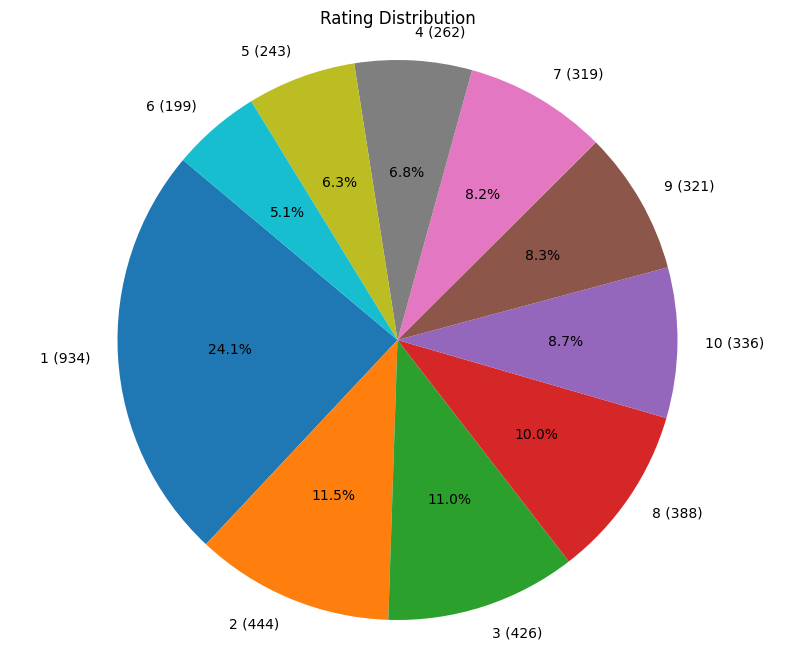

In [44]:
import matplotlib.pyplot as plt

# Menghitung jumlah setiap rating
rating_counts = df_cleaned['rating'].value_counts()

# Membuat pie chart
plt.figure(figsize=(10, 8))
plt.pie(rating_counts, labels=[f'{label} ({count})' for label, count in zip(rating_counts.index, rating_counts)], 
                                 autopct='%1.1f%%', startangle=140)
plt.title('Rating Distribution')
plt.axis('equal')  # Agar pie chart berbentuk lingkaran
plt.show()

In [45]:
# Import library yang dibutuhkan
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Fungsi untuk membuat WordCloud berdasarkan rating dalam Series
def plot_wordcloud_by_rating(series_text, series_rating):
    unique_ratings = series_rating.unique()  # Mendapatkan rating yang unik
    fig, ax = plt.subplots(len(unique_ratings), 1, figsize=(12, len(unique_ratings) * 6))

    # Looping untuk setiap rating
    for i, rating in enumerate(unique_ratings):
        # Gabungkan semua teks untuk rating tertentu
        text = " ".join(series_text[series_rating == rating])
        wordcloud = WordCloud(width=500, height=250, background_color='white', colormap='viridis').generate(text)

        # Plotting
        ax[i].imshow(wordcloud, interpolation='bilinear')
        ax[i].set_title(f'WordCloud Rating {rating}', fontsize=16)
        ax[i].axis('off')  # Menghilangkan sumbu axis

    plt.tight_layout()
    plt.show()



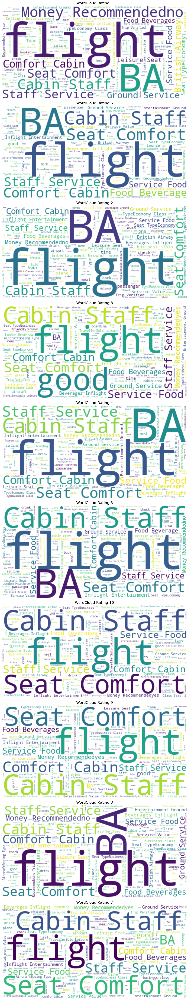

In [46]:
plot_wordcloud_by_rating(df_cleaned['reviews'], df_cleaned['rating'])

In [47]:
reviews = df_cleaned['reviews']
reviews

0       ✅ Trip Verified |   On arriving at Mexico Airp...
1       ✅ Trip Verified |   I have flown British Airwa...
2       Not Verified | We bought tickets for a Geneva-...
3       ✅ Trip Verified |   Appalling service with fai...
4       ✅ Trip Verified | British Airways charge you f...
                              ...                        
3872    LHR-HKG on Boeing 747 - 23/08/12. Much has bee...
3873    LHR to HAM. Purser addresses all club passenge...
3874    My son who had worked for British Airways urge...
3875    London City-New York JFK via Shannon on A318 b...
3876    SIN-LHR BA12 B747-436 First Class. Old aircraf...
Name: reviews, Length: 3872, dtype: object

### **Text Processing**

In [48]:
# Download Stopwords

import nltk
# nltk.download('stopwords')

In [49]:
# Define Stopwords
## Load Stopwords from NLTK
from nltk.corpus import stopwords
stop_words = stopwords.words("english")

print('Stopwords from NLTK')
print(len(stop_words), stop_words)
print('')

## Create A New Stopwords
new_stop_words = ['aye', 'mine', 'have', 'guys', 'ba', 'son', 'british', 'airways', 'sin'
                  'value', 'money','one', 'would','lhr','get','got','u','verified','even','via','could',
                  'day','minute','told','airport','way','leg','world','also','two','flew','flying','take',
                  'made','another','make','asked','said','although','overall','row']

## Merge Stopwords
stop_words_en = stop_words + new_stop_words
stop_words_en = list(set(stop_words_en))
print('Out Final Stopwords')
print(len(stop_words_en), stop_words_en)

Stopwords from NLTK
179 ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own',

In [22]:
# nltk.download('punkt')
# nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Dimasmo\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.


True

In [50]:
from nltk.stem import SnowballStemmer
from nltk.stem import WordNetLemmatizer

# Inisialisasi stemmer untuk bahasa Inggris
stemmer = SnowballStemmer("english")

# Inisialisasi lemmatizer
lemmatizer = WordNetLemmatizer()

In [51]:
from nltk.tokenize import word_tokenize

In [52]:
def text_preprocessing(text):

    # Mengubah teks menjadi huruf kecil (case folding)
    text = text.lower().replace("trip verified", "")

    # Menghapus karakter non-huruf (hanya menyimpan alfabet dan spasi)
    text = ''.join([char if char.isalpha() or char.isspace() else ' ' for char in text])

    # Menghapus spasi berlebihan (menjaga hanya satu spasi antar kata)
    text = ' '.join(text.split())

    # Tokenisasi (memecah teks menjadi kata-kata terpisah)
    tokens = word_tokenize(text)

    # Menghapus kata yang hanya terdiri dari 1 karakter
    tokens = [word for word in tokens if len(word) > 1]

    # Menghapus stopwords (dengan asumsi 'stpwds_id_add' sudah didefinisikan sebelumnya)
    tokens = [word for word in tokens if word not in stop_words_en]

    # Proses stemming (dengan asumsi 'stemmer' sudah didefinisikan sebelumnya)
    # tokens = [stemmer.stem(word) for word in tokens]

    # Proses lemmatize
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    # Menggabungkan kembali token menjadi satu string
    text = ' '.join(tokens)

    return text


In [27]:
# nltk.download('punkt_tab')

[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\Dimasmo\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt_tab.zip.


True

In [53]:
# Menerapkan fungsi text_preprocessing ke kolom 'text' pada data train
df_cleaned['reviews_processed'] = df_cleaned['reviews'].apply(text_preprocessing)
df_cleaned['reviews_processed']


0       arriving mexico flight delayed aircraft broken...
1       flown many year still regularly last flight pa...
2       bought ticket geneva london flight airline ove...
3       appalling service failing defective fleet airc...
4       charge pleasure choosing seat put back club tu...
                              ...                        
3872    hkg boeing much written tired old fleet go ann...
3873    ham purser address club passenger name boardin...
3874    worked urged fly kansa city recommended join e...
3875    london city new york jfk shannon really nice s...
3876    sin first class old aircraft seat private u ca...
Name: reviews_processed, Length: 3872, dtype: object

In [54]:
reviews

0       ✅ Trip Verified |   On arriving at Mexico Airp...
1       ✅ Trip Verified |   I have flown British Airwa...
2       Not Verified | We bought tickets for a Geneva-...
3       ✅ Trip Verified |   Appalling service with fai...
4       ✅ Trip Verified | British Airways charge you f...
                              ...                        
3872    LHR-HKG on Boeing 747 - 23/08/12. Much has bee...
3873    LHR to HAM. Purser addresses all club passenge...
3874    My son who had worked for British Airways urge...
3875    London City-New York JFK via Shannon on A318 b...
3876    SIN-LHR BA12 B747-436 First Class. Old aircraf...
Name: reviews, Length: 3872, dtype: object

In [55]:
df_cleaned['reviews_processed'].isna().sum()

0

### **Sentiment Analysis Using VADER**

In [57]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()


# function to calculate vader sentiment
def vadersentimentanalysis(review):
    vs = analyzer.polarity_scores(review)
    return vs['compound']

df_cleaned['sentiment'] = df_cleaned['reviews_processed'].apply(vadersentimentanalysis)

# function to analyse
def vader_analysis(compound):
    if compound >= 0.5:
        return 'Positive'
    elif compound < 0 :
        return 'Negative'
    else:
        return 'Neutral'
df_cleaned['analysis'] = df_cleaned['sentiment'].apply(vader_analysis)
df_cleaned.head()

,reviews,rating,reviews_processed,sentiment,analysis
0,✅ Trip Verified | On arriving at Mexico Airp...,1,arriving mexico flight delayed aircraft broken...,0.5267,Positive
1,✅ Trip Verified | I have flown British Airwa...,1,flown many year still regularly last flight pa...,0.0690,Neutral
2,Not Verified | We bought tickets for a Geneva-...,1,bought ticket geneva london flight airline ove...,0.1027,Neutral
3,✅ Trip Verified | Appalling service with fai...,1,appalling service failing defective fleet airc...,-0.5423,Negative
4,✅ Trip Verified | British Airways charge you f...,6,charge pleasure choosing seat put back club tu...,0.9832,Positive


In [60]:
vader_counts = df_cleaned['analysis'].value_counts()
vader_counts

analysis
Positive    2868
Negative     666
Neutral      338
Name: count, dtype: int64

In [77]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3872 entries, 0 to 3876
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   reviews            3872 non-null   object 
 1   rating             3872 non-null   object 
 2   reviews_processed  3872 non-null   object 
 3   sentiment          3872 non-null   float64
 4   analysis           3872 non-null   object 
 5   sentiment2         3872 non-null   object 
 6   label              3872 non-null   int32  
dtypes: float64(1), int32(1), object(5)
memory usage: 226.9+ KB


### **Visualization**

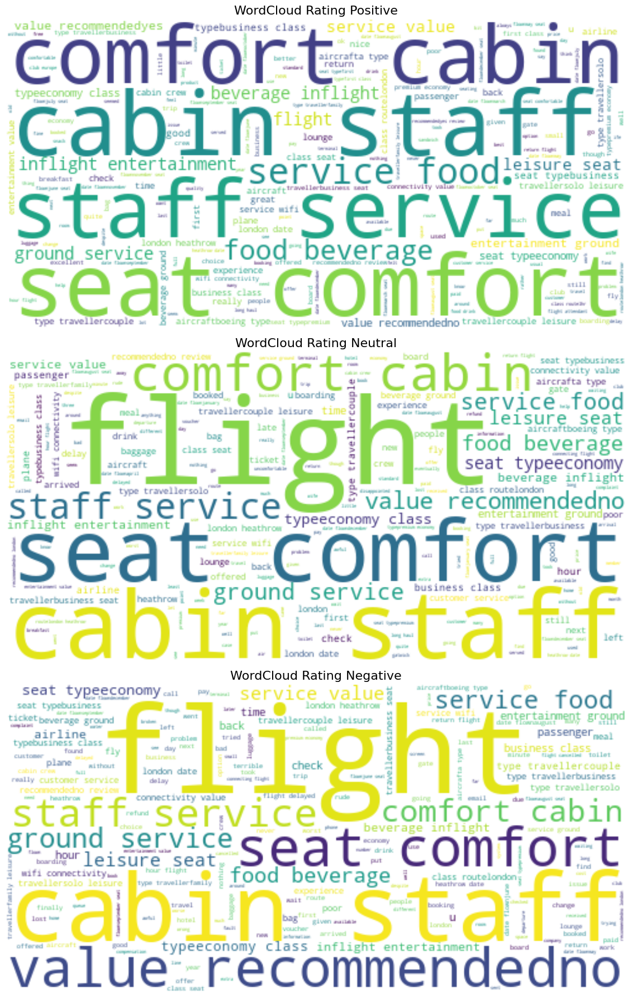

In [62]:
plot_wordcloud_by_rating(df_cleaned['reviews_processed'], df_cleaned['analysis'])

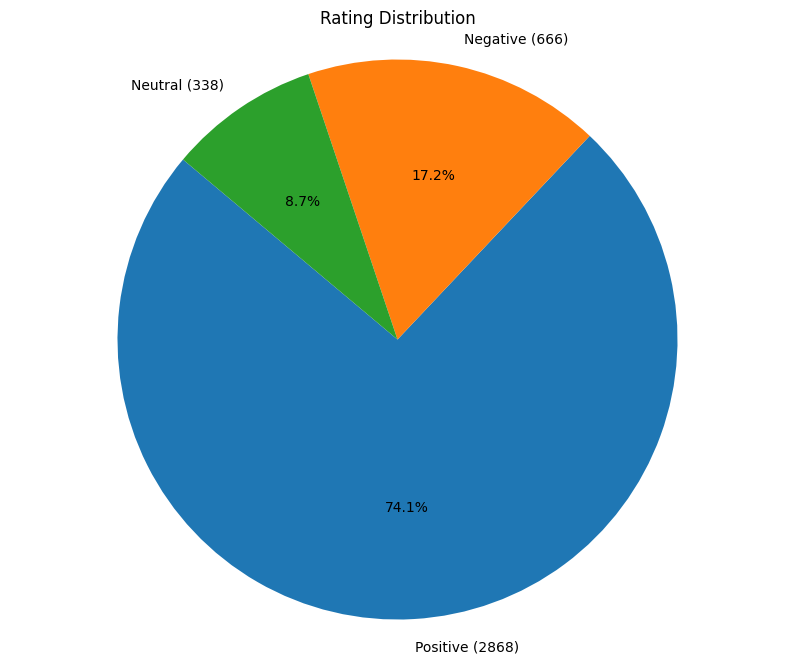

In [63]:
import matplotlib.pyplot as plt

# Menghitung jumlah setiap rating
rating_counts = df_cleaned['analysis'].value_counts()

# Membuat pie chart
plt.figure(figsize=(10, 8))
plt.pie(rating_counts, labels=[f'{label} ({count})' for label, count in zip(rating_counts.index, rating_counts)], 
                                 autopct='%1.1f%%', startangle=140)
plt.title('Rating Distribution')
plt.axis('equal')  # Agar pie chart berbentuk lingkaran
plt.show()

### **Target Conversion**

In [64]:
# Change Target into Number

df_cleaned['sentiment2']= df_cleaned['rating'].replace({'1' : 'negative', '2' : 'negative', '3' : 'negative',
                                                    '4' : 'neutral', '5':'neutral', '6':'neutral',
                                                    '7' : 'positive', '8':'positive', '9':'positive', '10':'positive'})

df_cleaned['label']= df_cleaned['rating'].replace({'1' : 0, '2' : 0, '3' : 0,
                                                    '4' : 1, '5':1, '6':1,
                                                    '7' : 2, '8':2, '9':2, '10':2}).astype('int')

df_cleaned

,reviews,rating,reviews_processed,sentiment,analysis,sentiment2,label
0,✅ Trip Verified | On arriving at Mexico Airp...,1,arriving mexico flight delayed aircraft broken...,0.5267,Positive,negative,0
1,✅ Trip Verified | I have flown British Airwa...,1,flown many year still regularly last flight pa...,0.0690,Neutral,negative,0
2,Not Verified | We bought tickets for a Geneva-...,1,bought ticket geneva london flight airline ove...,0.1027,Neutral,negative,0
3,✅ Trip Verified | Appalling service with fai...,1,appalling service failing defective fleet airc...,-0.5423,Negative,negative,0
4,✅ Trip Verified | British Airways charge you f...,6,charge pleasure choosing seat put back club tu...,0.9832,Positive,neutral,1
...,...,...,...,...,...,...,...
3872,LHR-HKG on Boeing 747 - 23/08/12. Much has bee...,4,hkg boeing much written tired old fleet go ann...,0.9493,Positive,neutral,1
3873,LHR to HAM. Purser addresses all club passenge...,9,ham purser address club passenger name boardin...,0.9231,Positive,positive,2
3874,My son who had worked for British Airways urge...,5,worked urged fly kansa city recommended join e...,0.8020,Positive,neutral,1
3875,London City-New York JFK via Shannon on A318 b...,4,london city new york jfk shannon really nice s...,0.9324,Positive,neutral,1


In [65]:
df_cleaned['sentiment2'].value_counts()

sentiment2
negative    1804
positive    1364
neutral      704
Name: count, dtype: int64

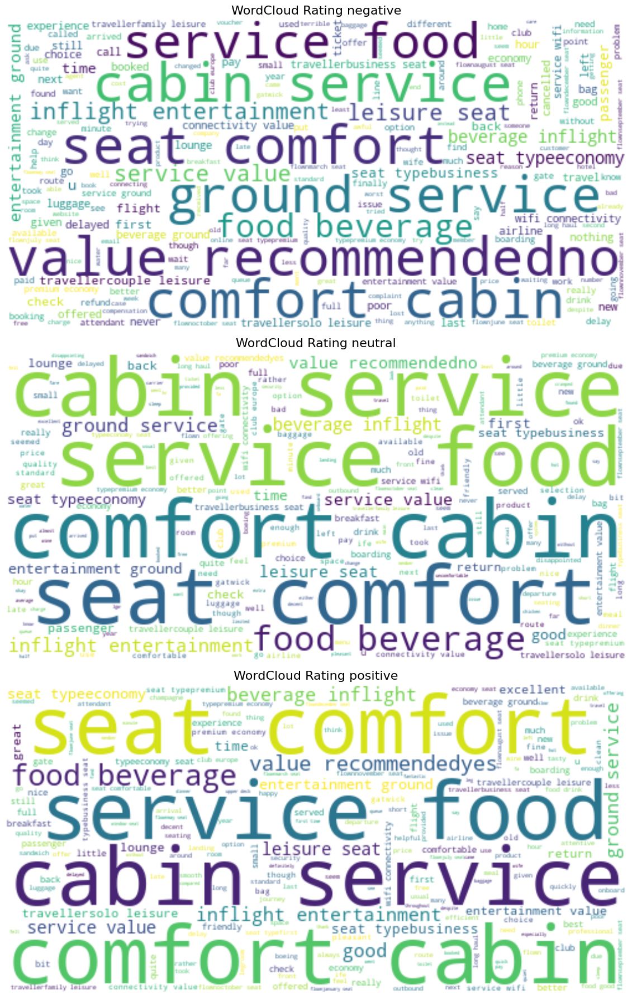

In [159]:
plot_wordcloud_by_rating(df_cleaned['reviews_processed'], df_cleaned['sentiment'])

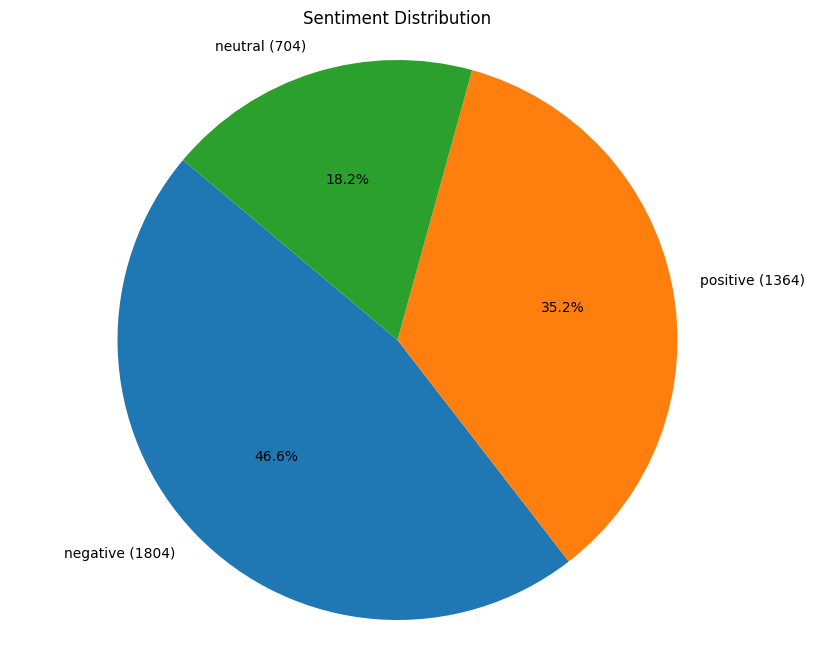

In [66]:
# Menghitung jumlah setiap sentiment
sentiment_counts = df_cleaned['sentiment2'].value_counts()

# Membuat pie chart
plt.figure(figsize=(10, 8))
plt.pie(sentiment_counts, labels=[f'{label} ({count})' for label, count in zip(sentiment_counts.index, sentiment_counts)], 
                                 autopct='%1.1f%%', startangle=140)
plt.title('Sentiment Distribution')
plt.axis('equal')  # Agar pie chart berbentuk lingkaran
plt.show()

In [68]:
from sklearn.feature_extraction.text import CountVectorizer

# Get Vocabularies

Vectorize = CountVectorizer()
reviews_vec = Vectorize.fit_transform(df_cleaned['reviews_processed'])

reviews_vec

<3872x12092 sparse matrix of type '<class 'numpy.int64'>'
	with 299704 stored elements in Compressed Sparse Row format>

In [69]:
# Finding the Number of Vocabs and Max Token Length in One Document

total_vocab = len(Vectorize.vocabulary_.keys())
max_sen_len = max([len(i.split(" ")) for i in df_cleaned['reviews_processed']])

print('Total Vocab : ', total_vocab)
print('Maximum Sentence Length : ', max_sen_len, 'tokens')

Total Vocab :  12092
Maximum Sentence Length :  363 tokens


In [70]:
# Text Vectorization

from tensorflow.keras.layers import TextVectorization

text_vectorization = TextVectorization(max_tokens=total_vocab,
                                       standardize="lower_and_strip_punctuation",
                                       split="whitespace",
                                       ngrams=None,
                                       output_mode="int",
                                       output_sequence_length=max_sen_len,
                                       input_shape=(1,)) # Only use in Sequential API

text_vectorization.adapt(df_cleaned['reviews_processed'])

In [71]:
# View the Top 20 Tokens (Sorted by the Highest Frequency of Appearance)

text_vectorization.get_vocabulary()[:150]

['',
 '[UNK]',
 'seat',
 'service',
 'flight',
 'food',
 'cabin',
 'class',
 'staff',
 'value',
 'comfort',
 'beverage',
 'ground',
 'entertainment',
 'london',
 'date',
 'type',
 'inflight',
 'time',
 'leisure',
 'crew',
 'recommendedno',
 'good',
 'heathrow',
 'typeeconomy',
 'hour',
 'airline',
 'economy',
 'business',
 'recommendedyes',
 'passenger',
 'check',
 'first',
 'typebusiness',
 'drink',
 'plane',
 'u',
 'meal',
 'return',
 'back',
 'lounge',
 'club',
 'boarding',
 'travellercouple',
 'experience',
 'customer',
 'aircraftboeing',
 'new',
 'bag',
 'review',
 'travellersolo',
 'aircrafta',
 'fly',
 'aircraft',
 'routelondon',
 'like',
 'long',
 'wifi',
 'really',
 'well',
 'better',
 'minute',
 'premium',
 'choice',
 'year',
 'comfortable',
 'gatwick',
 'much',
 'great',
 'connectivity',
 'travellerbusiness',
 'served',
 'poor',
 'offered',
 'old',
 'friendly',
 'luggage',
 'nice',
 'full',
 'due',
 'still',
 'excellent',
 'board',
 'next',
 'last',
 'arrived',
 'however',
 

In [72]:
from sklearn.feature_extraction.text import CountVectorizer
# CountVectorizer with Stopwords

vect_sw = CountVectorizer(stop_words = stop_words_en)

vect_sw.fit(reviews)
reviews_vect_sw = vect_sw.transform(reviews)
reviews_vect_sw

<3872x14614 sparse matrix of type '<class 'numpy.int64'>'
	with 321365 stored elements in Compressed Sparse Row format>

In [18]:
# df.to_csv("data/BA_reviews.csv")